In [1]:
## IMPORTS 
import matplotlib.pyplot as plt # plotting library
import numpy as np # this module is useful to work with numerical arrays
import random 
import torch
import torchvision 
from torchvision import datasets
from torchvision.transforms import ToTensor
import torchvision.transforms as T

#import torchvision
#from torchvision import transforms
from torch.utils.data import DataLoader
from torch.utils.data import Dataset
import matplotlib.image as mpimg
import matplotlib.pyplot as plt 


#import splitfolders
from torch import nn
import torch.nn.functional as F
import torch.optim as optim
#from tqdm.notebook import tqdm
import glob
import time
import PIL
from PIL import Image
import os
import cv2
import timm

In [2]:
## IMPORTING THE MIDAS NETWORK

#model_type = "DPT_Large"     # MiDaS v3 - Large     (highest accuracy, slowest inference speed)
#model_type = "DPT_Hybrid"   # MiDaS v3 - Hybrid    (medium accuracy, medium inference speed)
model_type = "MiDaS_small"  # MiDaS v2.1 - Small   (lowest accuracy, highest inference speed)

midas = torch.hub.load("intel-isl/MiDaS", model_type, trust_repo=True)

Using cache found in /home/server/.cache/torch/hub/intel-isl_MiDaS_master
Using cache found in /home/server/.cache/torch/hub/rwightman_gen-efficientnet-pytorch_master


Loading weights:  None


In [3]:
## COMPUTATIONAL RESSOURCES 

!nvidia-smi

Tue Aug  9 11:43:34 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 510.85.02    Driver Version: 510.85.02    CUDA Version: 11.6     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA GeForce ...  Off  | 00000000:03:00.0 Off |                  N/A |
| 28%   40C    P5     8W / 180W |     68MiB /  8192MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [4]:
# Activate cuda
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

Selected device: cuda


In [5]:
## BIG DATASET RESIZED 256 WITH DISTINCT SCENES FOR TRAIN AND TEST

# Original images 
#full_data_path='data/big_images_dataset_256'
train_images_path='data/distinct_scenes_dataset_256/train/images'
test_images_path='data/distinct_scenes_dataset_256/test/images'

#Associated depth maps
#full_depth_maps_path ='data/big_depth_maps_dataset_256'
train_depth_map_path='data/distinct_scenes_dataset_256/train/depth_maps'
test_depth_map_path='data/distinct_scenes_dataset_256/test/depth_maps'

In [6]:
#LOADING DATA

def load_data(data_path, verbose=False):
    DATA_LOADED=False 
    print_every_n_loads=10
    images=[]
    ind=0
    t0=time.time()
    if not DATA_LOADED:
      print('Loading data...')
      list_dir = os.listdir(data_path)
      list_dir=sorted(list_dir, key=lambda x: x.lower())
      for filename in list_dir:
          if ind<3:
            print(str(filename)) #TO CHECK IF THE PAIRING BETWEEN DEPTHMAPS AND IMAGES IS CORRECT
          img = mpimg.imread(os.path.join(data_path, filename))
          if img is not None:
              images.append(img)
              ind+=1
          if verbose:
              if ind%print_every_n_loads==0:
                  print('nb of data loaded:', ind)
      print(f'Loaded data in: {time.time()-t0 } s')
    return images

##NO SCENE DISTINCTION PROCESS
#images=load_data(full_data_path)
#depth_maps=load_data(full_depth_maps_path)

##SCENE DISTINCTION PROCESS
train_images=load_data(train_images_path)
test_images=load_data(test_images_path)
train_depth_maps=load_data(train_depth_map_path)
test_depth_maps=load_data(test_depth_map_path)

Loading data...
old_rainbow_resized_256_20220509T222940.000Z.jpg
old_rainbow_resized_256_20220509T222944.000Z.jpg
old_rainbow_resized_256_20220509T222948.000Z.jpg
Loaded data in: 6.662304639816284 s
Loading data...
ghost_cityresized_256_20220510T222041.000Z.jpg
ghost_cityresized_256_20220510T222046.000Z.jpg
ghost_cityresized_256_20220510T222051.000Z.jpg
Loaded data in: 1.619598388671875 s
Loading data...
old_rainbow_resized_256_depth_20220509T222940.000Z.png
old_rainbow_resized_256_depth_20220509T222944.000Z.png
old_rainbow_resized_256_depth_20220509T222948.000Z.png
Loaded data in: 7.379976272583008 s
Loading data...
ghost_city_depth_map_resized_256_depth_20220510T222041.000Z.png
ghost_city_depth_map_resized_256_depth_20220510T222046.000Z.png
ghost_city_depth_map_resized_256_depth_20220510T222051.000Z.png
Loaded data in: 1.7523257732391357 s


In [7]:
DATA_LOADED=True
#NUM_TRAIN=len(train_images)
#NUM_VAL=len(val_images)
#NUM_TEST=len(test_images)
#H, W, C=train_images[0].shape
#print(NUM_TRAIN, NUM_VAL, NUM_TEST)
SCALE_FACTOR=1000 #Need to increaze the really small values in the depth_maps data,
# otherwise, during transformation, all elements are set to zero.

In [8]:
class Original_and_Depth_Map(torch.utils.data.Dataset):

    def __init__(self, listA, listB, network_input_size, transformA=None, transformB=None):
        self.listA= listA
        self.listB= listB
        self.datasetA = []
        self.datasetB = []
        self.network_input_size=network_input_size
       
    #Making sure all images have the same size before creating an array
        for el, img in zip(self.listA, self.listB):
            new_imA=el[:,:456,:]
            self.datasetA.append(new_imA)
            new_imB=img[:,:456]
            self.datasetB.append(new_imB)
        #self.datasetA=np.array(self.datasetA).astype(np.uint8)
        #self.datasetB=(np.array(self.datasetB)*1000).astype(np.uint8)
        
        self.transformA= transformA
        self.transformB= transformB
        
    def __getitem__(self, index):
        xA = self.datasetA[index]
        xA=Image.fromarray(xA)
        xA= T.functional.resize(xA, self.network_input_size)
        
        xB = self.datasetB[index]
        xB=Image.fromarray(xB)
        xB= T.functional.resize(xB, self.network_input_size)
        
        if self.transformA:
            xA=self.transformA(xA)
    
        if self.transformB:
            xB=self.transformB(xB)
        
        
    
        return np.array(xA), np.array(xB)*1000
            
        
        return xA, xB

    def __len__(self):
        return len(self.datasetA)

In [9]:
# LOADING THE NECESSARY MIDAS TRANSFORM

midas_transforms = torch.hub.load("intel-isl/MiDaS", "transforms", trust_repo=True)

if model_type == "DPT_Large" or model_type == "DPT_Hybrid":
    transform_midas = midas_transforms.dpt_transform
else:
    transform_midas = midas_transforms.small_transform

Using cache found in /home/server/.cache/torch/hub/intel-isl_MiDaS_master


In [10]:
batch_size = 16

# CREATING THE TRAIN VAL AND TEST DATASETS 


##NO SCENE DISTINCTION PROCESS

#full_dataset =Original_and_Depth_Map(images, depth_maps)
#train_and_eval_size = 2500
#test_size = 451
#train_and_eval, test_dataset = torch.utils.data.random_split(full_dataset, [train_and_eval_size, test_size])

      
#train_size= 2250
#val_size = 250
#train_dataset, val_dataset = torch.utils.data.random_split(train_and_eval, [train_size, val_size])

#train_loader = DataLoader(train_dataset, batch_size, shuffle=True, num_workers=2, pin_memory=True)
#val_loader = DataLoader(val_dataset, batch_size, shuffle=True, num_workers=2, pin_memory=True)
#test_loader = DataLoader(test_dataset, batch_size=1, shuffle=True, num_workers=2, pin_memory=True)


## SCENE DISTINCTION PROCESS 

network_input_size=(128, 256)
#transform=T.Compose([T.ToTensor(), T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))])

train_and_val_dataset =Original_and_Depth_Map(train_images, train_depth_maps, network_input_size)
test_dataset =Original_and_Depth_Map(test_images, test_depth_maps, network_input_size)

train_size= 2500
val_size = 345
train_dataset, val_dataset= torch.utils.data.random_split(train_and_val_dataset, [train_size, val_size])



train_loader = DataLoader(train_dataset, batch_size, shuffle=True, num_workers=2, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size, shuffle=True, num_workers=2, pin_memory=True)
#test_loader = DataLoader(test_dataset, batch_size, shuffle=True, num_workers=2, pin_memory=True)



In [11]:
#LENGHT TEST 

print(len(train_dataset), len(test_dataset), len(val_dataset))

2500 681 345


In [12]:
image, depth= next(iter(train_loader))
midas.to(device)
print(image.size())
midas.train()
image.to(device)
print(type(image))
image = np.transpose(image, [0,3,1,2])
image=image.type(torch.cuda.FloatTensor)
output=midas(image)

torch.Size([16, 128, 256, 3])
<class 'torch.Tensor'>


2127


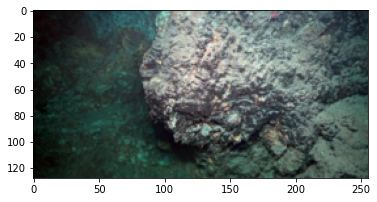

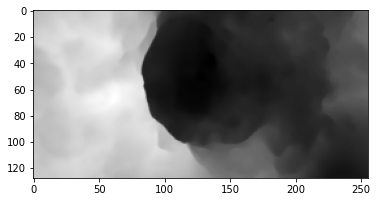

<Figure size 432x288 with 0 Axes>

In [13]:
ind=np.random.randint(2499)
print(ind)
img, d= train_dataset[ind]
#img=np.transpose(img, [1,2,0])
plt.imshow(img)
plt.figure()
plt.imshow(train_dataset[ind][1], cmap='gray')
plt.figure()
#ORDRE OK!!
torch.cuda.empty_cache()

In [14]:
#Transformation applied to all images 
for image, _ in train_loader:
  for im in image:
    im=transform_midas(im.numpy()).to(device)
   



In [15]:
# METRICS COMPUATION

def safe_log10(x, eps=1e-10):     
    result = np.where(x > eps, x, -10)     
    np.log10(result, out=result, where=result > 0)     
    return result


def compute_errors(gt, pred):
    """Computation of error metrics between predicted and ground truth depths
       Metrics have to be computed independently on each image 
    """
    abs_rel_batch, sq_rel_batch, rmse_batch, rmse_log_batch, a1_batch, a2_batch, a3_batch= [], [], [], [], [], [], []
    
    for gt_im, pred_im in zip(gt, pred):
        eps=1e-3
        thresh = np.maximum((gt_im / (pred_im+eps)), (pred_im / (gt_im+eps)))
        thresh.type(torch.FloatTensor)
        #print(type(thresh))
        #print(1.*(thresh < 1.25     ))

        a1 = (1*(thresh < 1.25     )).numpy()
        a2 = (1*(thresh < 1.25 ** 2)).numpy()
        a3 = (1*(thresh < 1.25 ** 3)).numpy()

        a1=a1.mean()
        a2=a2.mean()
        a3=a3.mean()
        

        rmse= (gt - pred) ** 2
        rmse= np.sqrt(rmse.mean())

        rmse_log= (safe_log10(gt) - safe_log10(pred) )** 2
        rmse_log = np.sqrt(rmse_log.mean())

        abs_rel= (np.abs(gt - pred) / (gt+eps)).mean()

        sq_rel= (((gt - pred) ** 2) / (gt+eps)).mean()
        
        abs_rel_batch.append(abs_rel.item())
        sq_rel_batch.append(sq_rel.item())
        rmse_batch.append(rmse.item())
        rmse_log_batch.append(rmse_log.item())
        a1_batch.append(a1.item())
        a2_batch.append(a2.item())
        a3_batch.append(a3.item())

    return abs_rel_batch, sq_rel_batch, rmse_batch, rmse_log_batch, a1_batch, a2_batch, a3_batch


In [16]:
#Training function

def train_epoch(network, device, dataloader, optimizer, loss_function, print_every = 20):
    """ Trains the simple model for one epoch. losses_resolution indicates how often training_loss should be printed and stored. """
    network.train()
    network.to(device)
    
    train_losses = []
    rmse_epoch=np.array([])
    rmse_log_epoch=np.array([])
    abs_rel_epoch=np.array([])
    sq_rel_epoch=np.array([])
    a1_epoch=np.array([])
    a2_epoch=np.array([])
    a3_epoch=np.array([])

    # Iterate the dataloader (We do not need the label value which is 0 here, the depth maps are the labels)
    iter = 0
    for image, depth_map in dataloader:   
      #Moving to GPU
      image.to(device)
      d = depth_map.to(device)

      #Applying the necessary transforms
      #(transform_midas does not keep the transformations in memory of the dataloader.)
      #Best= apply it the the entire dataset in its definition
      image=np.transpose(image,[0,3,1,2])
      image = image.type(torch.cuda.FloatTensor)
      d=d.type(torch.cuda.FloatTensor)


      #Going through the network
      d_hat = network(image)
    

      #Computing the loss, storing it
      #d_test=T.functional.resize(d, (128, 256))
      loss=loss_function(d_hat.squeeze(),  d).float()


      # Backward pass
      optimizer.zero_grad()  # Sets the gradients attached to the parameters objects to zero.
      loss.backward()  # Uses the gradient object attached to the loss to recursively compute the gradients of the parameters of the network (and store their value in the gradient objects attached to said parameters)
      optimizer.step()  # Actually chages the values of the parameters using their gradients, computed on the previous line of code.
      
      #Store batch loss
      batch_loss = loss.item()/d.shape[0]
      train_losses.append(batch_loss)

      #Store values for metrics 
      abs_rel, sq_rel, rmse, rmse_log, a1, a2, a3 = compute_errors(d.detach().cpu(), d_hat.detach().cpu())
      
      abs_rel_epoch=np.concatenate((abs_rel, abs_rel_epoch))
      sq_rel_epoch=np.concatenate((sq_rel, sq_rel_epoch))
      rmse_epoch=np.concatenate((rmse, rmse_epoch))
      rmse_log_epoch=np.concatenate((rmse_log, rmse_log_epoch))
      a1_epoch=np.concatenate((a1, a1_epoch))
      a2_epoch=np.concatenate((a2, a2_epoch))
      a3_epoch=np.concatenate((a3, a3_epoch))
    
      #Display
      #f iter%print_every == 0:
          #prinf'\t partial train loss (single batch): {batch_loss:.2f}')
    
    return train_losses, abs_rel_epoch, sq_rel_epoch, rmse_epoch, rmse_log_epoch, a1_epoch, a2_epoch, a3_epoch


cuda
output size torch.Size([1, 128, 256])
original depth map size torch.Size([128, 256])
tensor(194.5546, device='cuda:0', grad_fn=<L1LossBackward0>)


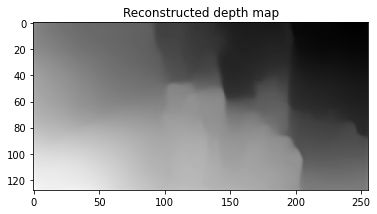

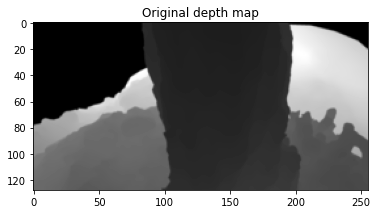

<Figure size 432x288 with 0 Axes>

In [17]:
#CHECKING THAT THE FORWARD FUNCTION WORKS OK, STEP BY STEP
midas.to(device)
loss_function=nn.L1Loss()
loss_function.to(device)
print(device)

for image, depth in train_loader:
  #print(image.size())
  #print(depth.size()
  #midas.train()
  depth.to(device)
  image.to(device)
  for im, d in zip(image, depth):
    im=transform_midas(im.numpy()).to(device)
    d.to(device)
    output=midas(im).to(device)
    
    print('output size', output.size())
    plt.imshow(output.cpu().detach().squeeze().numpy(), cmap='gray')
    plt.title('Reconstructed depth map')
    plt.figure()
    plt.title('Original depth map')
    plt.imshow(depth[0],cmap='gray')
    plt.figure()
    print('original depth map size', d.size())
    loss=loss_function(output.squeeze().to(device), d[:128, :256].to(device))
    print(loss)
    break
  break

In [18]:
torch.cuda.empty_cache()
torch.cuda.memory_summary(device=None, abbreviated=True)

'|===========================================================================|\n|                  PyTorch CUDA memory summary, device ID 0                 |\n|---------------------------------------------------------------------------|\n|            CUDA OOMs: 0            |        cudaMalloc retries: 0         |\n|===========================================================================|\n|        Metric         | Cur Usage  | Peak Usage | Tot Alloc  | Tot Freed  |\n|---------------------------------------------------------------------------|\n| Allocated memory      |  201612 KB |    1943 MB |    3734 MB |    3537 MB |\n|---------------------------------------------------------------------------|\n| Active memory         |  201612 KB |    1943 MB |    3734 MB |    3537 MB |\n|---------------------------------------------------------------------------|\n| GPU reserved memory   |  376832 KB |    2088 MB |    2144 MB |    1776 MB |\n|--------------------------------------------------

In [19]:
#First try training loop 

torch.cuda.empty_cache()
lr=1e-3
weight_decay=1e-3
l1=nn.L1Loss()
optim= torch.optim.Adam(midas.parameters(), lr=lr, weight_decay=weight_decay)

train_losses, abs_rel_epoch, sq_rel_epoch, rmse_epoch, rmse_log_epoch, a1_epoch, a2_epoch, a3_epoch = train_epoch(midas, device, train_loader,optim, l1)

In [20]:
# Trying to get a grasp on the model:

DISPLAY_LAYERS=False
# Print model's state_dict: What is going on inside our model?
#print("Model's state_dict:")
if DISPLAY_LAYERS:
    for param_tensor in midas.state_dict():
        print(param_tensor, "\t", midas.state_dict()[param_tensor].size())

In [21]:
## Testing function

def validation_epoch(network, device, loss_function, dataloader):
    "Set evaluation mode for encoder and decoder"
    network.to(device)
    network.eval()  # evaluation mode, equivalent to "network.train(False)""
    val_loss = 0
    with torch.no_grad(): # No need to track the gradients
        for image, depth_map in dataloader:
            #Moving to GPU
            
            image.to(device)
            d = depth_map.to(device)

            #Applying the necessary transforms
            image=np.transpose(image,[0,3,1,2])
            image = image.type(torch.cuda.FloatTensor)
            d=d.type(torch.cuda.FloatTensor)


            #Going through the network
            d_hat = network(image)
          

            #Computing the loss, storing it
            loss=loss_function(d_hat.squeeze(),  d).float()
            val_loss += loss.item()/d.shape[0]

    return val_loss/len(dataloader)


In [22]:
#Plotting the learning and validation loss curves


def plot_learning_curves(train_losses, val_losses):
    """ Plots the learning curve. Losses resolution (how many times the loss is displayed) is one value per batch for the training losses, and one value per epoch for the validation. """
    iterations_train = np.arange(0, batch_size*train_losses.size, batch_size)
    iterations_validation = np.arange(0, len(train_dataset)*val_losses.size, len(train_dataset))

    fig, ax = plt.subplots(figsize=(10, 10))
    #What happens during training 
    ax.plot(iterations_train, train_losses, color="blue", label="training loss")

    #What happens during validation
    ax.plot(iterations_validation, val_losses, color="orange", label = "validation loss")
    print(val_losses)
    
    ax.set(xlabel="iterations", ylabel="loss", title="Training and validation losses over iterations")
    ax.grid()
    ax.legend()

    fig.show()

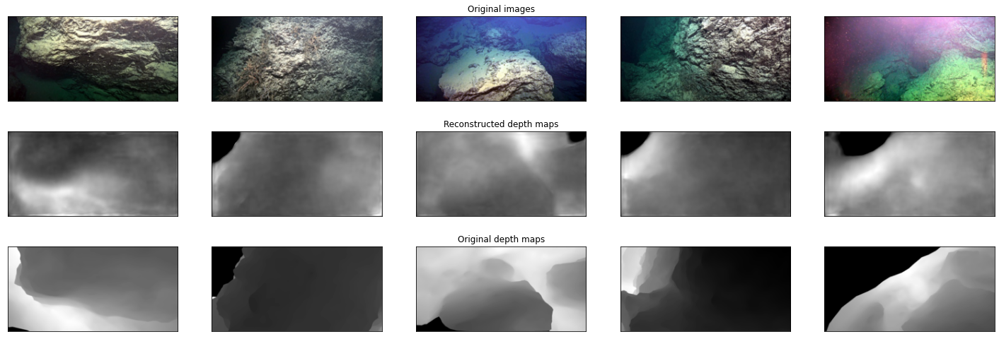

In [23]:
## Plotting function

def plot__outputs(network, number_outputs=5, random_plots=True, indices=None, title=None):
  """
    When random_plots = True, different images are taken between each epoch.
    When random_plots = False, indices indicates what images to plot
  """
  fig = plt.figure(figsize=(5*number_outputs,8.5))
  if title is not None:
    fig.suptitle(f'Results at the end of epoch {title}',  fontsize='large', fontweight='bold')
  
  #Selection of random images to plot within the dataset or a select set of indices
  if random_plots:
      plotted_samples = np.random.choice(len(test_dataset), number_outputs)
  else:
      plotted_samples = indices
  
  for i in range(number_outputs):
      ax = plt.subplot(3, number_outputs, i+1)
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)

      # plt.subplot(nb_rows, nb_cols, num)  where num is indexed from 1
      image = test_dataset[plotted_samples[i]][0]
      #image=np.transpose(image, [1,2,0])
      plt.imshow(image)
      
      #image = next(iter(test_loader))
      network.train()
      
      with torch.no_grad():
        
        #NECESSARY TRANSFORMS
        #np.transpose(image, [2,0,1])
        #transform=T.ToTensor()
        #image=transform(image)
        #image = image.type(torch.FloatTensor)
        #image.to(device)
        #image=transform_midas(image.type(torch.cuda.FloatTensor))
        #image=image.unsqueeze(0).to(device)
        image=transform_midas(image)
        output_img=network(image.to(device))
        #output_img  = network(np.transpose(torch.Tensor(image).unsqueeze(0), [0,3,1,2]).to(device))

      #right_size_im=np.transpose(im.cpu().squeeze().numpy(), (1, 2, 0))
      #plt.imshow(right_size_im*255)
      plt.imshow(test_dataset[plotted_samples[i]][0])
      if i == number_outputs//2:
          ax.set_title('Original images')
    
      

      ax = plt.subplot(3, number_outputs, i + 1 + number_outputs)
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)
      plt.imshow(output_img.cpu().squeeze().numpy(), cmap='gray')
      if i == number_outputs//2:
          ax.set_title('Reconstructed depth maps')
      
      ax=plt.subplot(3, number_outputs, i + 1 + 2*number_outputs)
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)

      #plt.imshow(test_dataset[plotted_samples[i]][1], cmap='gray')
      plt.imshow(test_dataset[plotted_samples[i]][1], cmap='gray')
      if i == number_outputs//2:
          ax.set_title('Original depth maps')

plot__outputs(midas)


 EPOCH 1/20 	 train loss 2.829 	 val loss 0.709 

 RMSE 25.938 	 RMSLE 2.354 	 abs rel 1874.017 	 sq rel 177873.652

 EPOCH 2/20 	 train loss 1.650 	 val loss 0.625 

 RMSE 23.807 	 RMSLE 2.144 	 abs rel 1592.556 	 sq rel 156415.043

 EPOCH 3/20 	 train loss 3.031 	 val loss 0.535 

 RMSE 22.706 	 RMSLE 2.016 	 abs rel 1416.318 	 sq rel 141302.350

 EPOCH 4/20 	 train loss 1.813 	 val loss 0.620 

 RMSE 21.526 	 RMSLE 1.908 	 abs rel 1286.242 	 sq rel 129806.134

 EPOCH 5/20 	 train loss 1.675 	 val loss 0.400 

 RMSE 20.663 	 RMSLE 1.819 	 abs rel 1173.356 	 sq rel 119419.321

 EPOCH 6/20 	 train loss 1.117 	 val loss 0.411 

 RMSE 19.853 	 RMSLE 1.741 	 abs rel 1076.041 	 sq rel 110244.249

 EPOCH 7/20 	 train loss 1.949 	 val loss 0.366 

 RMSE 19.200 	 RMSLE 1.681 	 abs rel 999.637 	 sq rel 102712.562

 EPOCH 8/20 	 train loss 3.340 	 val loss 0.400 

 RMSE 18.601 	 RMSLE 1.630 	 abs rel 936.658 	 sq rel 96600.785

 EPOCH 9/20 	 train loss 1.375 	 val loss 0.354 

 RMSE 18.256 	 R

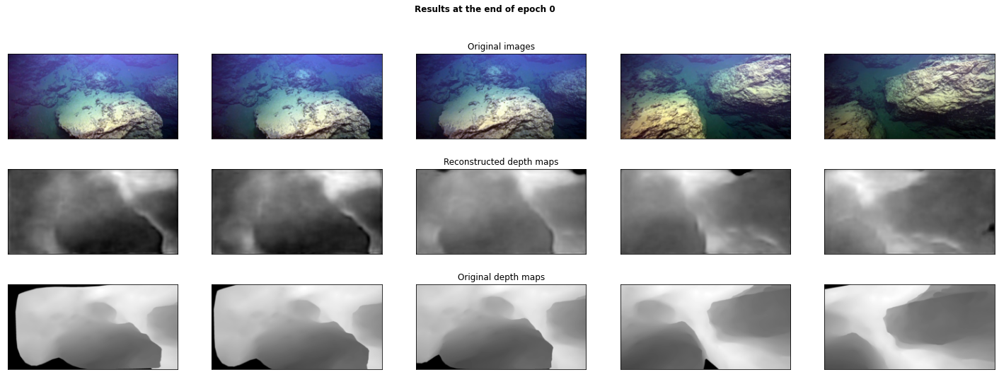

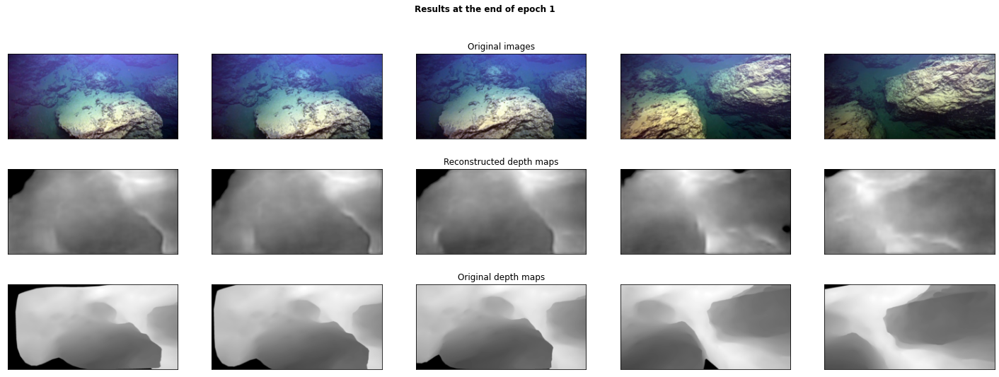

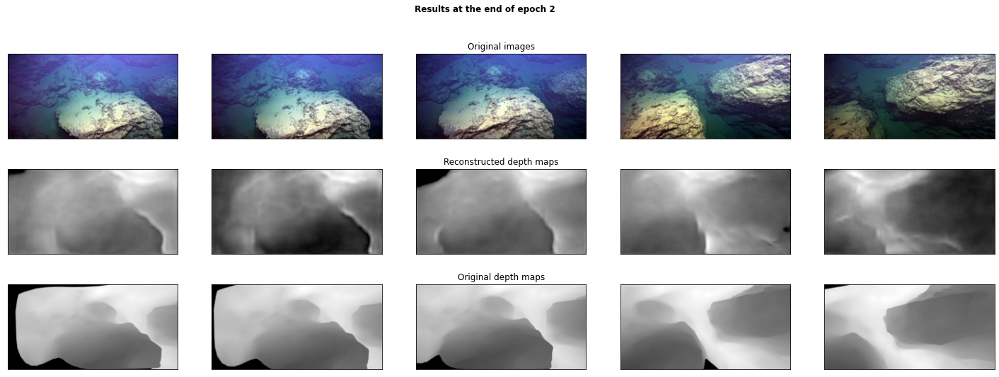

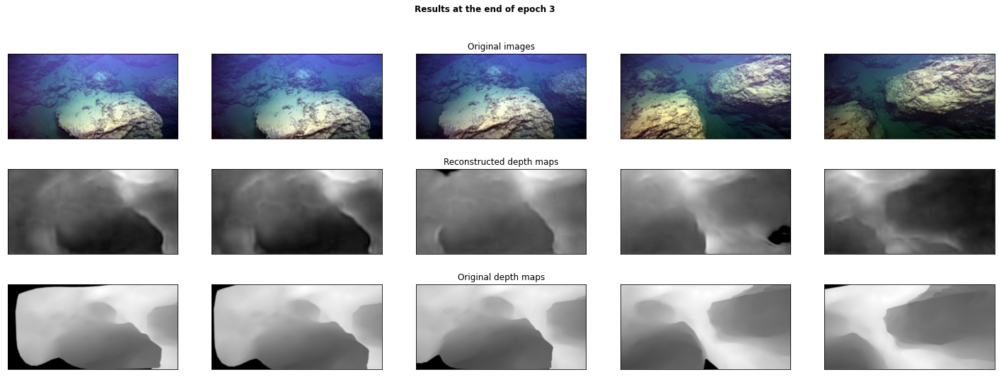

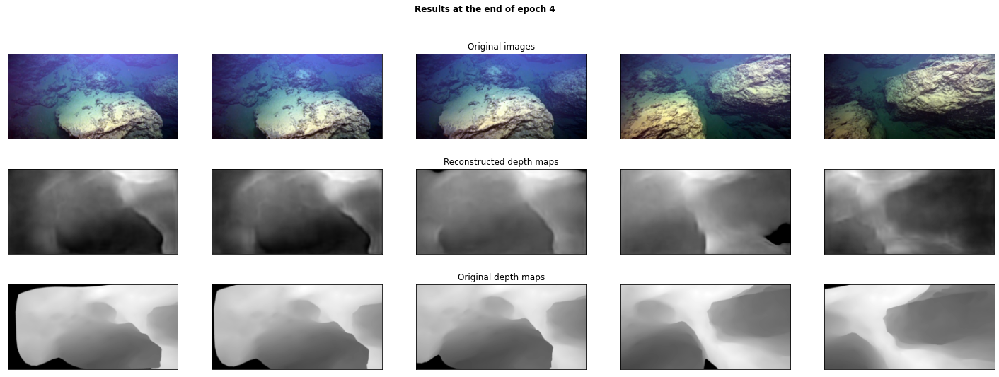

...

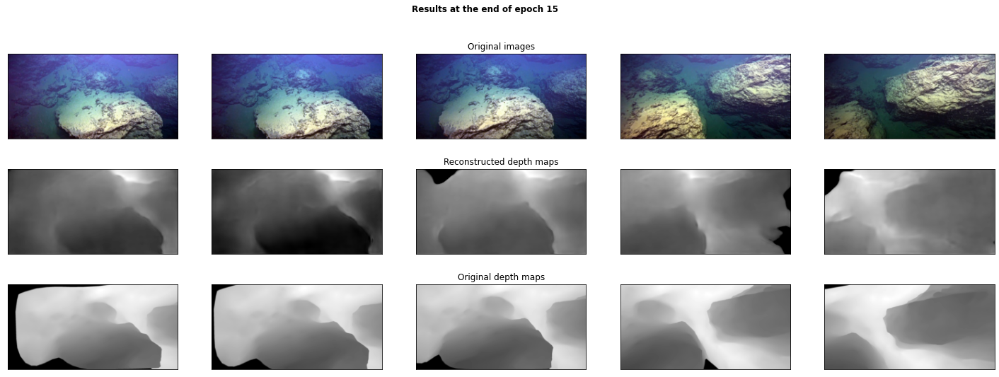

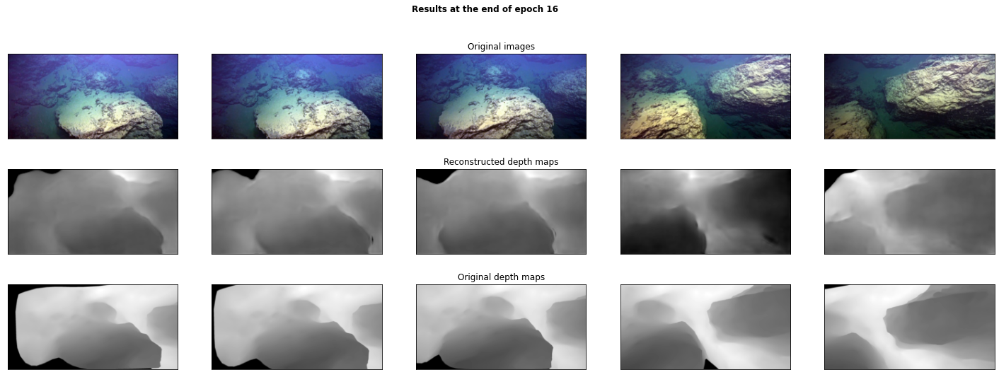

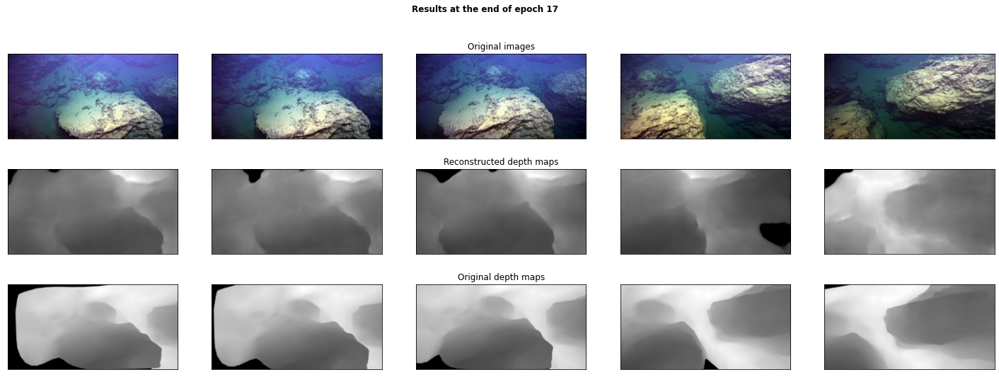

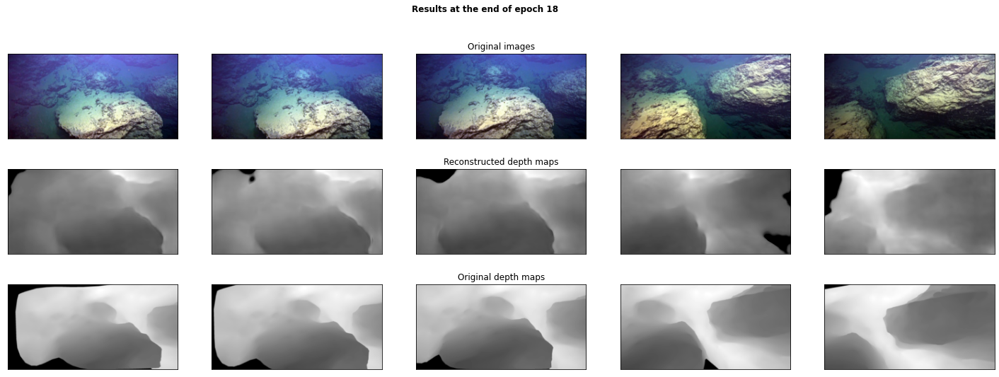

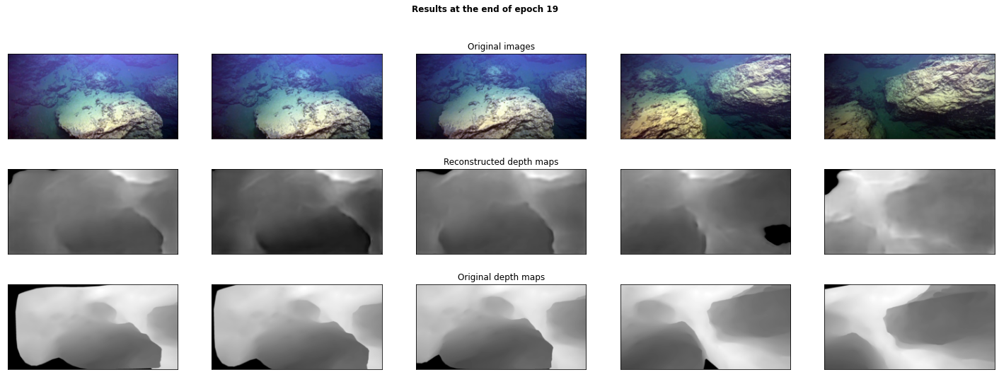

In [24]:
## Training and Validation processes


## Choice of different parameters
lr=1e-3
weight_decay=1e-4 #Weight regularization to avoid overfitting
number_of_plotted_images = 5
plot_images_every_n_epochs = 2
random_plots = False
indices_to_plot = np.arange(number_of_plotted_images)
num_epochs= 20
optim=torch.optim.Adam(midas.parameters(), lr=lr, weight_decay=weight_decay)

## Choice of the loss
mse=nn.MSELoss()
l1=nn.L1Loss()

train_losses = np.array([])
val_losses = np.array([validation_epoch(midas, device, mse, val_loader)]) #first evaluation before training?



rmse=np.array([])
rmse_log=np.array([])
abs_rel=np.array([])
sq_rel=np.array([])
a1=np.array([])
a2=np.array([])
a3=np.array([])


## Training process

print_metrics=True

train_net=True

if train_net:
    for epoch in range(num_epochs):
       #Optimising the model 
       train_losses_epoch, abs_rel_epoch, sq_rel_epoch, rmse_epoch, rmse_log_epoch, a1_epoch, a2_epoch, a3_epoch = train_epoch(midas, device, train_loader,optim, l1, print_every=100)
       
      #Assessing the model performance during training
       val_loss_epoch = validation_epoch(midas, device, l1, val_loader)

       #Storing 
       train_losses = np.concatenate((train_losses, train_losses_epoch))
       val_losses = np.append(val_losses, val_loss_epoch)


       abs_rel=np.concatenate((abs_rel_epoch, abs_rel))
       sq_rel=np.concatenate((sq_rel_epoch, sq_rel))
       rmse=np.concatenate((rmse_epoch, rmse))
       rmse_log=np.concatenate((rmse_log_epoch, rmse_log))
       a1=np.concatenate((a1_epoch, a1))
       a2=np.concatenate((a2_epoch, a2))
       a3=np.concatenate((a3_epoch, a3))


       print(f'\n EPOCH {epoch + 1}/{num_epochs} \t train loss {train_losses_epoch[-1]:.3f} \t val loss {val_loss_epoch:.3f} ')
       if print_metrics:
            print(f'\n RMSE {rmse.mean():.3f} \t RMSLE {rmse_log.mean():.3f} \t abs rel {abs_rel.mean():.3f} \t sq rel {sq_rel.mean():.3f}')

       #Plotting reconstruction results at the end of each epoch to see the evolution (on the same outputs)
       plot__outputs(midas, number_outputs=number_of_plotted_images, random_plots=random_plots, indices=indices_to_plot, title=epoch)


[53.05670333  0.70867519  0.62540117  0.53542377  0.61959794  0.40012055
  0.41147217  0.36570354  0.40002466  0.35368175  0.29949208  0.37340212
  0.35969387  0.29024211  0.29735918  0.36735114  0.27131832  0.27308197
  0.25626456  0.30303994  0.32271063]


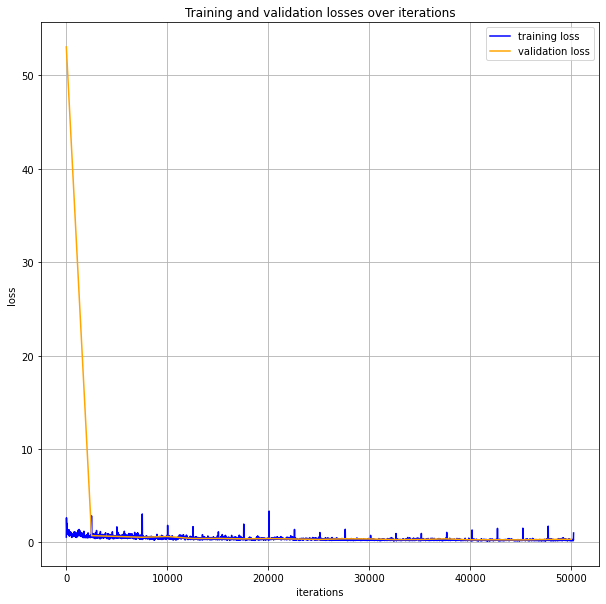

In [25]:
# Losses with medium_structure_model
plot_learning_curves(train_losses, val_losses)


**Thoughts**

The validation loss is huge before starting to train the network. It could be coherent, as weights are uninitialized in this training (yet the value stays really big). I could have used the weights obtained from a pre-training on Image Net. It could be interseting to see the difference of performance if I do so.

The validation loss gently decreazes, such as the training loss. There seems to be no overfitting. At the beginning of each epoch, the training loss peaks. There are also spikes during the full training process. According to : 
https://stats.stackexchange.com/questions/303857/explanation-of-spikes-in-training-loss-vs-iterations-with-adam-optimizer,

this is the result of my optimisation method. As I use an Adam optimizer, at each iteration, the loss is computed on a batch. Each batch, selected randomly, gives different perfomances, and it happens that the selected batch has images which are more difficult to rebuild.

Metrics at the end of the training process: RMSE: 14.544, RMSLE: 1.295, abs rel: 563.170, sq rel 59080.936. I find weird the value of the sq rel which should in theory be lower than the abs rel as it is the error squared. Moreover, those values are so high that they must be false. howe

**Comparison**

| Dataset                     | Method      | RMSE    | RMSLE | ABS REL | SQ REL    |
|-----------------------------|-------------|---------|-------|---------|-----------|
| CITY SCAPES                 | Monodepth   | 4.39210 | 0.146 | 0.068   | 0.835     |
| KITTI                       | Monodepth   | 14.44   | 0.542 | 0.699   | 10.6      |
| Underwater images (Ifremer) | Midas_small | 14.544  | 1.295 | 563.170 | 59080.936 |





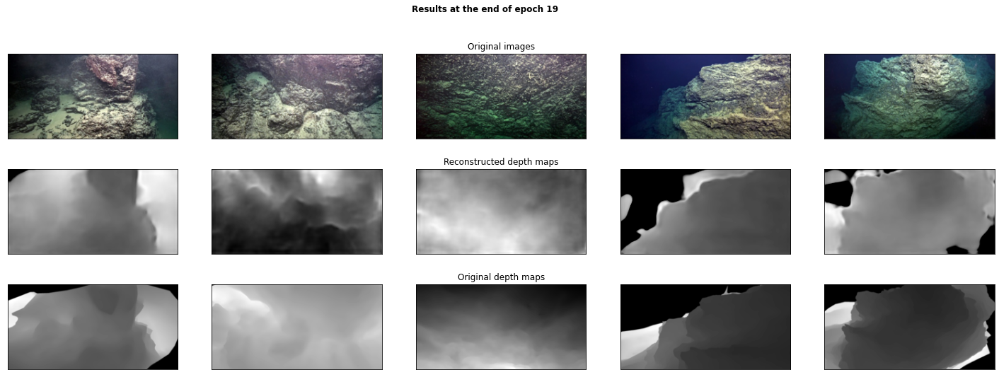

In [26]:
#Trying to visualize different output scenes:

number_of_plotted_images = 5
plot_images_every_n_epochs = 2
random_plots = True
test_size=681
indices_to_plot = np.arange(number_of_plotted_images)

plot__outputs(midas, number_outputs=number_of_plotted_images, random_plots=random_plots, indices=indices_to_plot, title=epoch)


## **Results analysis**
Understanding where the network fails to predict.

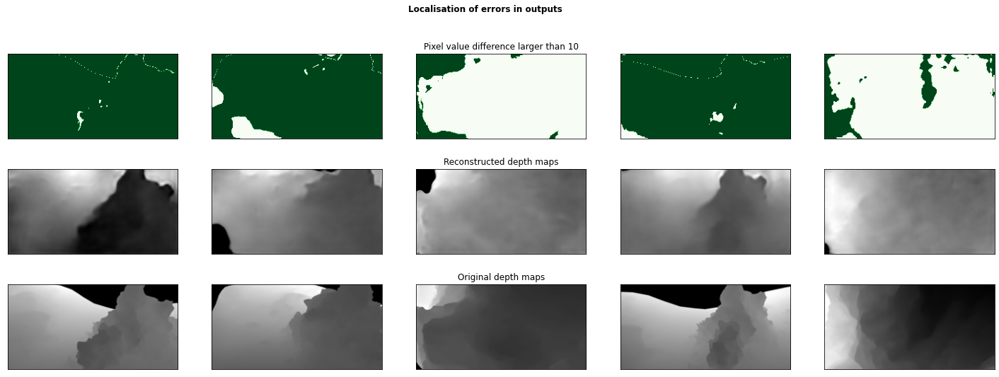

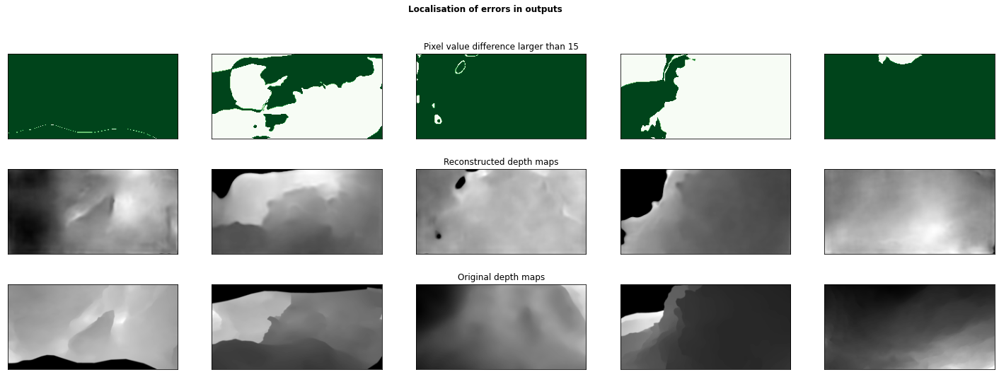

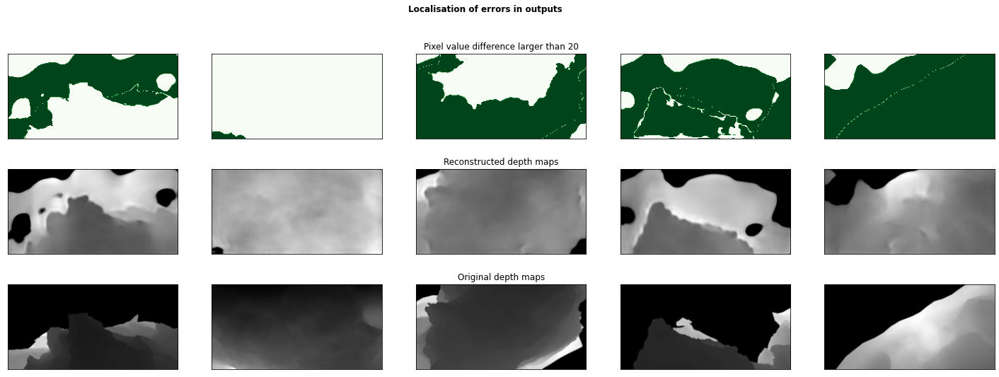

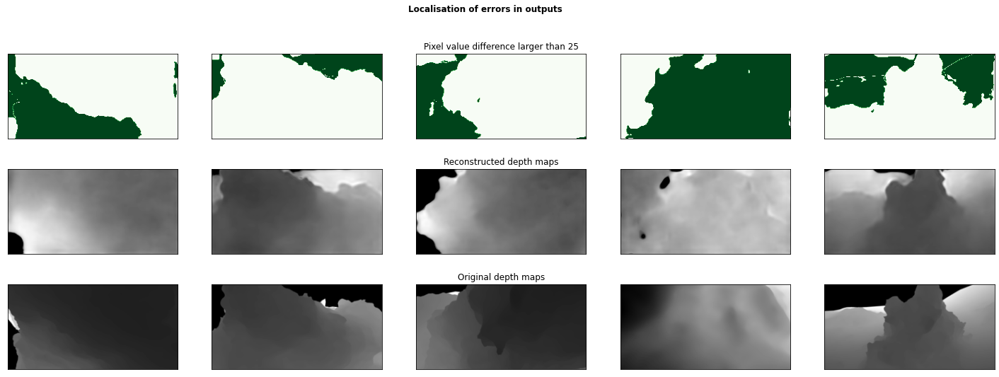

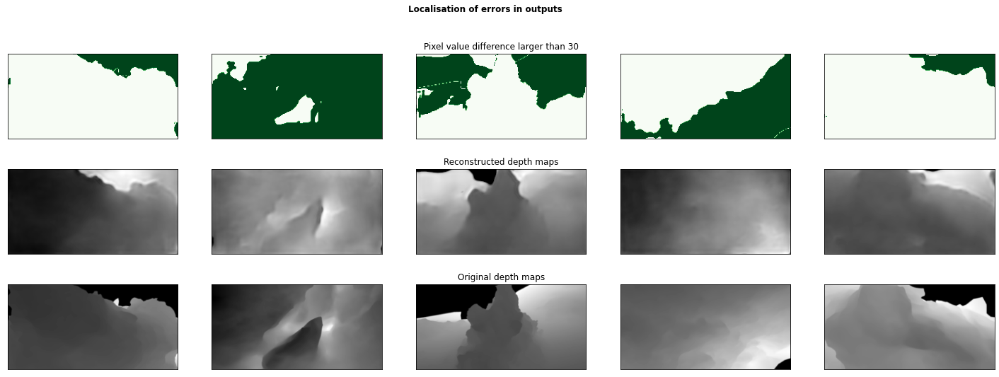

...

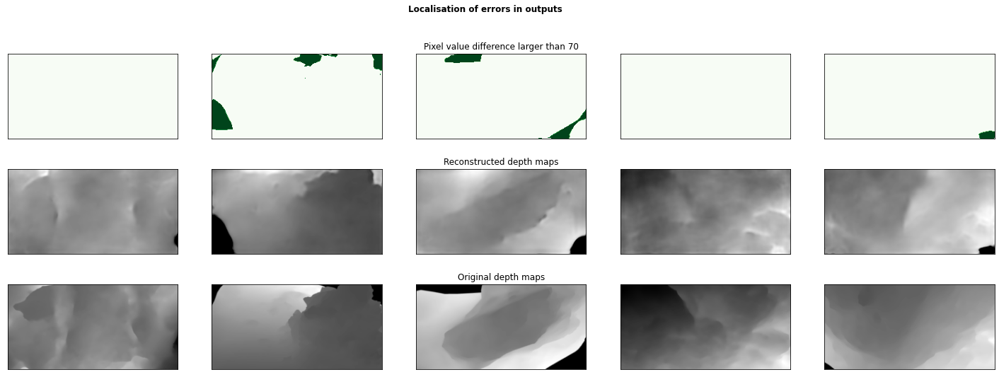

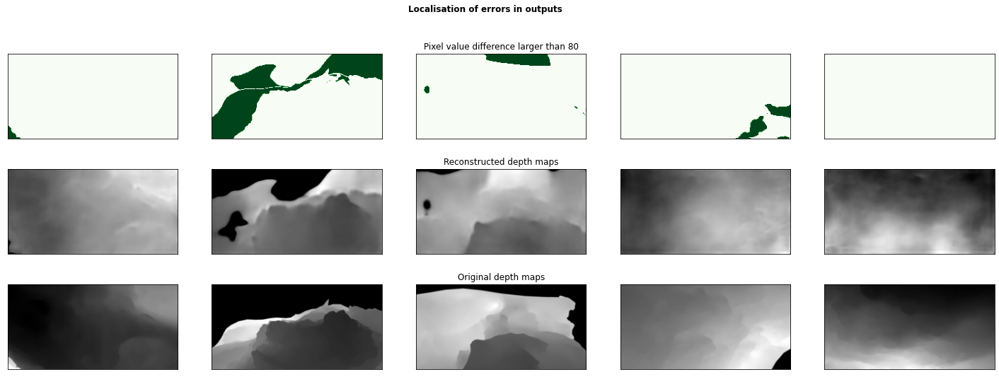

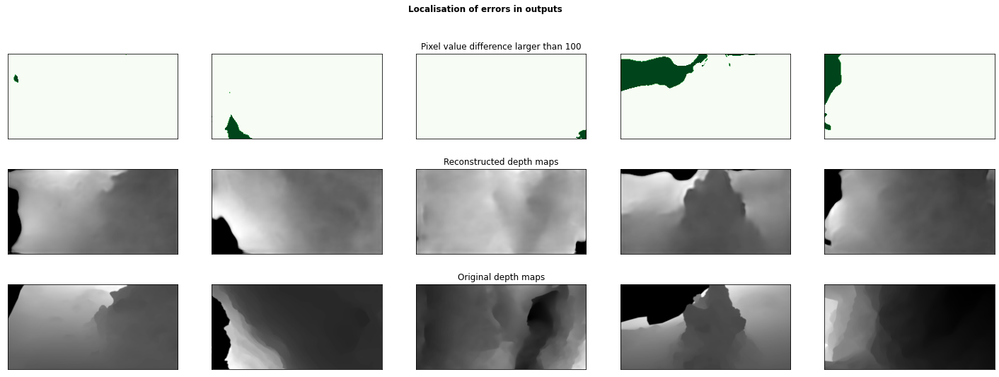

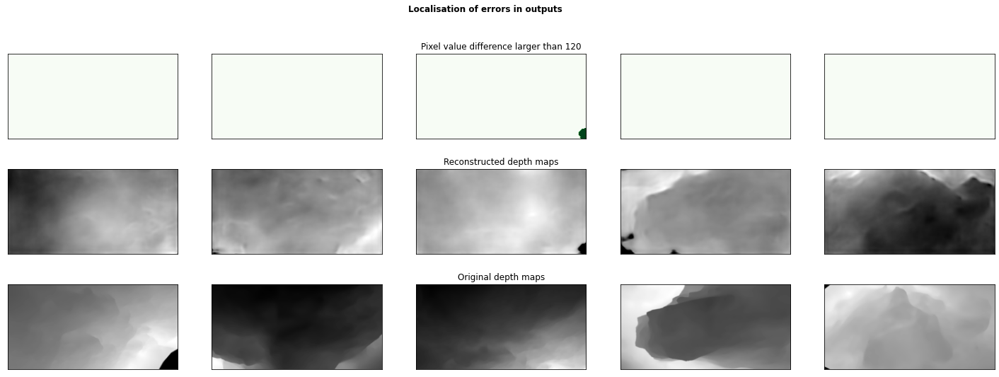

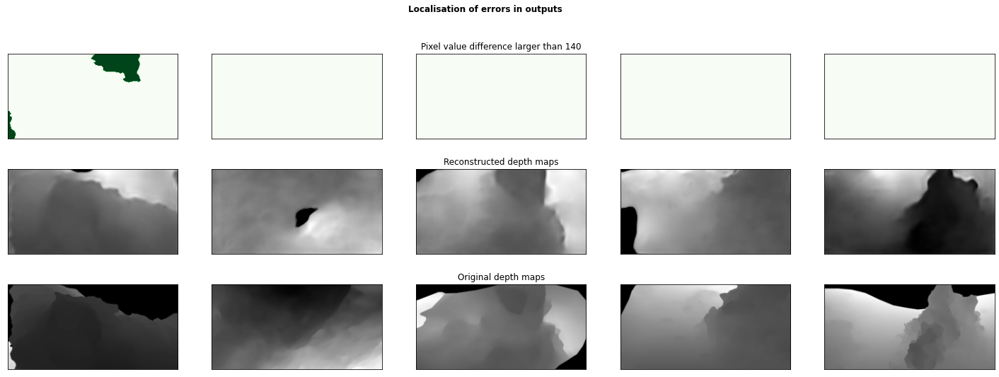

In [27]:
# Understanding where do the errors are concentrated

def display_error_zones(network, threshold=10, indices=None, random_plots=True, number_outputs=5, title='Localisation of errors in outputs', error_map='L2'):

  #Computing and saving the difference 

  #PLotting 


  fig = plt.figure(figsize=(5*number_outputs,8.5))
  
  if title is not None:
    fig.suptitle(f'{title}', fontsize='large', fontweight='bold')
  
  #Selection of random images to plot within the dataset or a select set of indices
  if random_plots:
      plotted_samples = np.random.choice(test_size, number_outputs)
  else:
      plotted_samples = indices
  
  for i in range(number_outputs):
      ax = plt.subplot(3, number_outputs, i+1)
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)

      # plt.subplot(nb_rows, nb_cols, num)  where num is indexed from 1
      image = test_dataset[plotted_samples[i]][0]
      depth_map= test_dataset[plotted_samples[i]][1]
      
      network.train()
      
      with torch.no_grad():
        
        #NECESSARY TRANSFORMS
        #Image
        np.transpose(image, [2,0,1])
        image=transform_midas(image)
        image=T.functional.resize(image, (128, 256))
        image = image.type(torch.cuda.FloatTensor)
       
        
        #Depth map
        #depth.type(torch.FloatTensor)
        #depth_map=T.functional.resize(depth_map, (128, 256))
        #depth_map = depth_map.type(torch.FloatTensor)
        #depth_map=depth_map.unsqueeze(0).to(device)
        
        #Network 
        network.train()
        output_img=network(image)
        
        
        
        #PIXEL DIFFERENCE
        if error_map=='Pixel difference':
            diff=np.abs(output_img.cpu().squeeze()-depth_map[:128, :256].squeeze())
            diff=255*(diff>threshold)
            plt.imshow(diff.numpy(), cmap='Greens')

        #L2 ERROR
        if error_map=='L2':
            l2_error_map= np.abs((output_img.cpu().squeeze()-depth_map[:128, :256].squeeze())**2)
            plt.imshow(l2_error_map.numpy(), cmap='OrRd')
            plt.colorbar()
       
        #L1 ERROR
        if error_map=='L1':
            l1_error_map= np.abs(output_img.cpu().squeeze()-depth_map[:128, :256].squeeze())
            plt.imshow(l1_error_map.numpy(), cmap='BuGn')
            plt.colorbar()
      
      
      
      
      
      
      if i == number_outputs//2:
        if error_map=='Pixel difference':
              ax.set_title(f'Pixel value difference larger than {threshold}')
        if error_map=='L2':
            ax.set_title(f' L2 error map')
        if error_map=='L1':
            ax.set_title(f' L1 error map')
      

      ax = plt.subplot(3, number_outputs, i + 1 + number_outputs)
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)
      plt.imshow(output_img.cpu().squeeze().numpy(), cmap='gray')
      if i == number_outputs//2:
          ax.set_title('Reconstructed depth maps')
      
      ax=plt.subplot(3, number_outputs, i + 1 + 2*number_outputs)
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)

      #plt.imshow(test_dataset[plotted_samples[i]][1], cmap='gray')
      plt.imshow(test_dataset[plotted_samples[i]][1], cmap='gray')
      if i == number_outputs//2:
          ax.set_title('Original depth maps')



Thresholds=[10,15,20,25,30, 60,70,80,100,120, 140]
for k in Thresholds:
  display_error_zones(midas, threshold=k, indices=None, random_plots=True, number_outputs=5, title='Localisation of errors in outputs', error_map='Pixel difference')


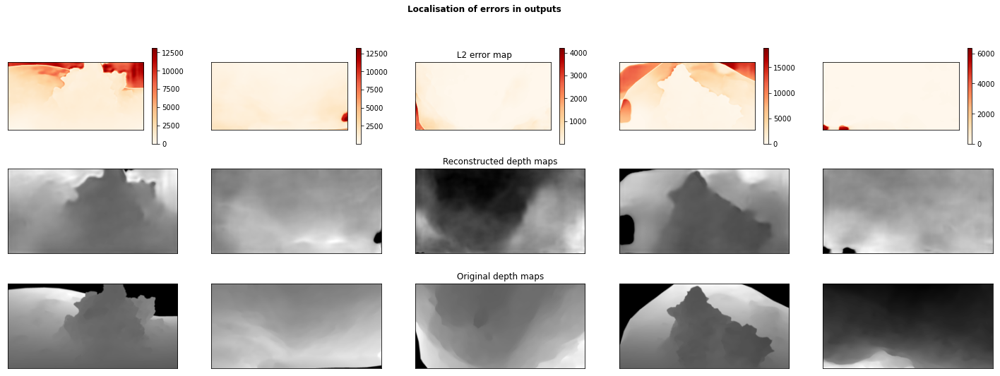

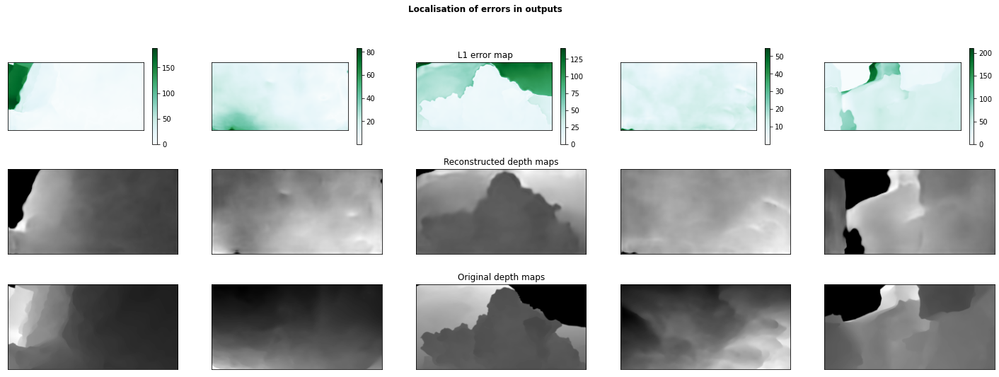

In [28]:
# L1 ERROR MAP

display_error_zones(midas, threshold=k, indices=None, random_plots=True, number_outputs=5, title='Localisation of errors in outputs', error_map='L2')

display_error_zones(midas, threshold=k, indices=None, random_plots=True, number_outputs=5, title='Localisation of errors in outputs', error_map='L1')

**Comments**

Performances of the network after 2 epochs of training

*Pixel value difference*= The difference, in pixels, between the initial image and the second image is mostly between 10 and 70. (Most errors concentrate around 30 pixels according to the images).

*L2 Errors*= In the colormaps presented above, struggles to reconstruct zones which are quite flat, and with a homogenous structure, like rock walls. It even adds holes which do not exist,  in the first and second image. On the second and fifth image, the shape begins to appear. The network reconstructs the boundary.



## **Learning to use TensorBoard**

In [29]:
from torch.utils.tensorboard import SummaryWriter

writer=SummaryWriter('runs')